In [1]:
library(DESeq2)

Loading required package: S4Vectors
Loading required package: stats4
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The following objects are masked from ‘package:stats’:

    IQR, mad, xtabs

The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, cbind, colnames, do.call,
    duplicated, eval, evalq, Filter, Find, get, grep, grepl, intersect,
    is.unsorted, lapply, lengths, Map, mapply, match, mget, order,
    paste, pmax, pmax.int, pmin, pmin.int, Position, rank, rbind,
    Reduce, rownames, sapply, setdiff, sort, table, tapply, union,
    unique, unsplit


Attaching package: ‘S4Vectors’

The following objects are masked from ‘package:base’:

    c

In [ ]:
%%bash

paste *.count | cut -f 1,2,4,6,8,10,12,14,16 > counts_merge.txt

echo -e "GeneID\tN1_24\tN1_36\tN2_24\tN2_36\tS1_24\tS1_36\tS2_24\tS2_36" > header_all.txt

cat header_all.txt counts_merge.txt | sed '/^__no_feature/,$d' > All_Counts.for.DESeq2.txt

In [2]:
raw_cnt = read.table("./All_Counts.for.DESeq2.txt",header=T,row.names = 1)
head(raw_cnt)

,N1_24,N1_36,N2_24,N2_36,S1_24,S1_36,S2_24,S2_36
ENSG00000000003,1307,1515,406,1266,1277,1321,558,1325
ENSG00000000005,16,8,3,16,13,4,6,9
ENSG00000000419,600,646,203,544,819,790,457,724
ENSG00000000457,63,95,41,98,137,230,101,222
ENSG00000000460,320,338,93,319,339,311,143,312
ENSG00000000938,1,1,3,2,3,0,0,1


In [3]:
count = raw_cnt[rowSums(raw_cnt>8)>6,]

In [4]:
dim(count)

[1] 14176     8

In [5]:
colnames(count)

[1] "N1_24" "N1_36" "N2_24" "N2_36" "S1_24" "S1_36" "S2_24" "S2_36"

In [6]:
head(count)

,N1_24,N1_36,N2_24,N2_36,S1_24,S1_36,S2_24,S2_36
ENSG00000000003,1307,1515,406,1266,1277,1321,558,1325
ENSG00000000419,600,646,203,544,819,790,457,724
ENSG00000000457,63,95,41,98,137,230,101,222
ENSG00000000460,320,338,93,319,339,311,143,312
ENSG00000001036,367,485,386,524,370,475,479,468
ENSG00000001084,513,488,184,456,535,546,301,494


In [7]:
condition = c("N24","N36","N24","N36","S24","S36","S24","S36")

In [8]:
sample = colnames(count)
sample

[1] "N1_24" "N1_36" "N2_24" "N2_36" "S1_24" "S1_36" "S2_24" "S2_36"

In [9]:
pdata = data.frame(condition,row.names=sample)

In [10]:
pdata

,condition
N1_24,N24
N1_36,N36
N2_24,N24
N2_36,N36
S1_24,S24
S1_36,S36
S2_24,S24
S2_36,S36


In [11]:
dds = DESeqDataSetFromMatrix(countData = count,colData = pdata,design = ~condition)

In [12]:
dds = DESeq(dds)

estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing


In [13]:
resultsNames(dds)

[1] "Intercept"    "conditionN24" "conditionN36" "conditionS24" "conditionS36"

In [14]:
#res_s = results(dds,contrast = c("conditon","SOX2_KD","NC"),lfcThreshold = 1, altHypothesis = "greaterAbs")
res_24= results(dds,contrast = c("condition","S24","N24"))
res_36= results(dds,contrast = c("condition","S36","N36"))

In [15]:
summary(res_24)


out of 14176 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 17, 0.12% 
LFC < 0 (down)   : 10, 0.071% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 11)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [16]:
summary(res_36)


out of 14176 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 337, 2.4% 
LFC < 0 (down)   : 177, 1.2% 
outliers [1]     : 0, 0% 
low counts [2]   : 0, 0% 
(mean count < 11)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [17]:
res_nc= results(dds,contrast = c("condition","N36","N24"))
summary(res_nc)


out of 14176 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 9, 0.063% 
LFC < 0 (down)   : 6, 0.042% 
outliers [1]     : 0, 0% 
low counts [2]   : 275, 1.9% 
(mean count < 16)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [29]:
res_s= results(dds,contrast = c("condition","S36","S24"))
summary(res_s)


out of 14176 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)     : 259, 1.8% 
LFC < 0 (down)   : 86, 0.61% 
outliers [1]     : 0, 0% 
low counts [2]   : 550, 3.9% 
(mean count < 20)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [18]:
head(res_24)

log2 fold change (MAP): condition S24 vs N24 
Wald test p-value: condition S24 vs N24 
DataFrame with 6 rows and 6 columns
                 baseMean log2FoldChange     lfcSE         stat     pvalue
                <numeric>      <numeric> <numeric>    <numeric>  <numeric>
ENSG00000000003 1087.4744    -0.00399989 0.4293066 -0.009317094 0.99256614
ENSG00000000419  577.4664     0.43251075 0.4128359  1.047657816 0.29479629
ENSG00000000457  118.5579     0.84747916 0.3761703  2.252913282 0.02426462
ENSG00000000460  263.3682     0.08819392 0.4368226  0.201898699 0.83999592
ENSG00000001036  436.0764    -0.01301655 0.3462920 -0.037588362 0.97001589
ENSG00000001084  426.1927     0.11572327 0.4085083  0.283282541 0.77696026
                     padj
                <numeric>
ENSG00000000003 0.9998212
ENSG00000000419 0.9998212
ENSG00000000457 0.9221856
ENSG00000000460 0.9998212
ENSG00000001036 0.9998212
ENSG00000001084 0.9998212

In [23]:
export_results = function(res,sample1='KD',sample2='NC',p=0.05) {
    res = results(dds,contrast = c("condition",sample1,sample2))
    res_sig = subset(res,padj < p )
    res_sig_order = res_sig[order(res_sig$padj),]
    res_sig_order2 = subset(res_sig_order, log2FoldChange >1 | log2FoldChange < -1)
    write.table(res_sig_order, file=paste("Diff_genes_",sample1,"_VS_",sample2,"_sig_padj",p,".txt",sep=""))
    write.table(res_sig_order2,file=paste("Diff_genes_",sample1,"_VS_",sample2,"_sig_padj",p,"_fc2.txt",sep=""))
}

In [21]:
export_results(res=res, sample1="S24", sample2="N24",p=0.01)

In [22]:
export_results(res, sample1="S36", sample2="N36",p=0.01)
export_results(sample1="N36", sample2="N24",p=0.01)
export_results(sample1="S36", sample2="S24")

In [55]:
head(res_36)

log2 fold change (MAP): condition S36 vs N36 
Wald test p-value: condition S36 vs N36 
DataFrame with 6 rows and 6 columns
                 baseMean log2FoldChange     lfcSE       stat      pvalue
                <numeric>      <numeric> <numeric>  <numeric>   <numeric>
ENSG00000000003 1087.4744    -0.10294642 0.4290736 -0.2399272 0.810386722
ENSG00000000419  577.4664     0.22376422 0.4124277  0.5425538 0.587437055
ENSG00000000457  118.5579     0.98434777 0.3693062  2.6653972 0.007689743
ENSG00000000460  263.3682    -0.10501094 0.4360812 -0.2408059 0.809705551
ENSG00000001036  436.0764    -0.13865564 0.3456390 -0.4011574 0.688304268
ENSG00000001084  426.1927     0.06063848 0.4080014  0.1486232 0.881850945
                     padj
                <numeric>
ENSG00000000003 0.9898996
ENSG00000000419 0.9588561
ENSG00000000457 0.1525257
ENSG00000000460 0.9898996
ENSG00000001036 0.9800622
ENSG00000001084 0.9908772

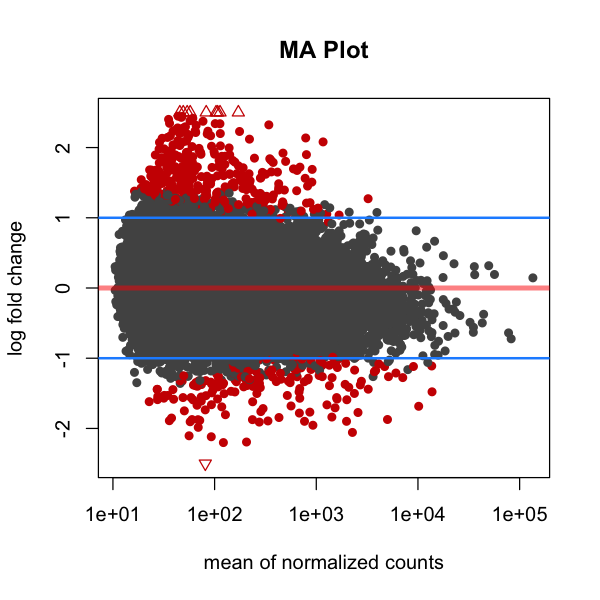

In [49]:
options(repr.plot.width=5, repr.plot.height=5)
res_sG <- results(dds, contrast = c("condition","S36","N36"))

plotMA(res_sG, main='MA Plot',ylim=c(-2.5,2.5),cex=1)

abline(h=c(-1,1),col="dodgerblue",lwd=2)


In [50]:
pdf("Diff_genes_S36_VS_N36.MA-Plot.pdf",width = 5,height = 5)
res_sG <- results(dds, contrast = c("condition","S36","N36"))

plotMA(res_sG, main='MA Plot',ylim=c(-2.5,2.5),cex=1)

abline(h=c(-1,1),col="dodgerblue",lwd=2)
dev.off()

pdf 
  2

In [52]:
head(res_24)

log2 fold change (MAP): condition S24 vs N24 
Wald test p-value: condition S24 vs N24 
DataFrame with 6 rows and 6 columns
                 baseMean log2FoldChange     lfcSE         stat     pvalue
                <numeric>      <numeric> <numeric>    <numeric>  <numeric>
ENSG00000000003 1087.4744    -0.00399989 0.4293066 -0.009317094 0.99256614
ENSG00000000419  577.4664     0.43251075 0.4128359  1.047657816 0.29479629
ENSG00000000457  118.5579     0.84747916 0.3761703  2.252913282 0.02426462
ENSG00000000460  263.3682     0.08819392 0.4368226  0.201898699 0.83999592
ENSG00000001036  436.0764    -0.01301655 0.3462920 -0.037588362 0.97001589
ENSG00000001084  426.1927     0.11572327 0.4085083  0.283282541 0.77696026
                     padj
                <numeric>
ENSG00000000003 0.9998212
ENSG00000000419 0.9998212
ENSG00000000457 0.9221856
ENSG00000000460 0.9998212
ENSG00000001036 0.9998212
ENSG00000001084 0.9998212

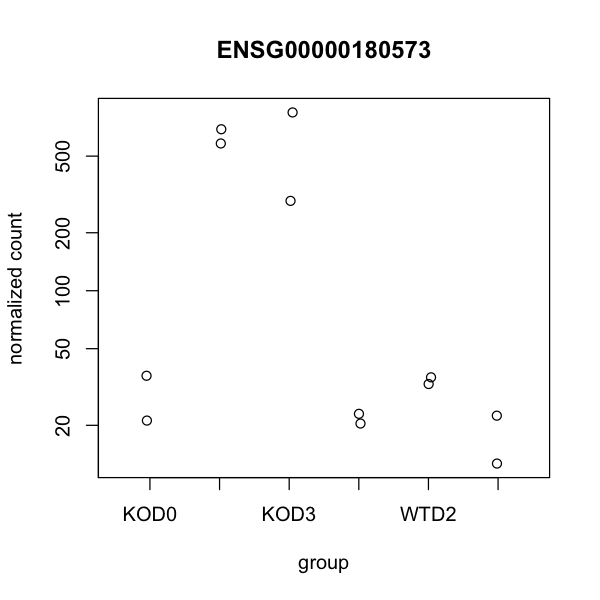

In [49]:
plotCounts(dds, gene=which.min(res_d3$padj), intgroup="condition")

In [29]:
dds


class: DESeqDataSet 
dim: 14327 12 
metadata(1): version
assays(3): counts mu cooks
rownames(14327): ENSG00000000003 ENSG00000000419 ... ENSG00000273344
  ENSG00000273373
rowData names(47): baseMean baseVar ... deviance maxCooks
colnames(12): S13_D0_A S13_D0_B ... WT_D3_A WT_D3_B
colData names(2): condition sizeFactor

In [19]:
rld <- rlog(dds)
vsd <- varianceStabilizingTransformation(dds)
rlogMat <- assay(rld)
vstMat <- assay(vsd)


Attaching package: ‘gplots’

The following object is masked from ‘package:IRanges’:

    space

The following object is masked from ‘package:S4Vectors’:

    space

The following object is masked from ‘package:stats’:

    lowess



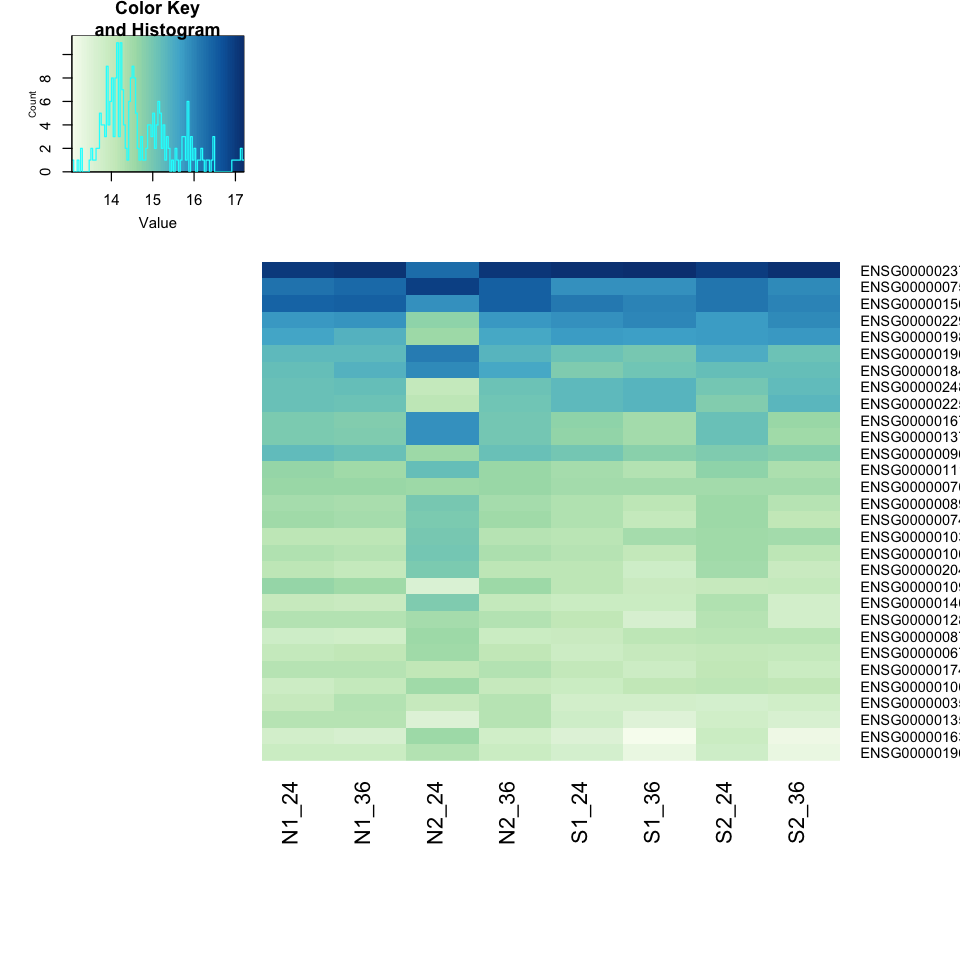

In [21]:
library("RColorBrewer")
library("gplots")
select <- order(rowMeans(counts(dds,normalized=TRUE)),decreasing=TRUE)[1:30]
hmcol <- colorRampPalette(brewer.pal(9, "GnBu"))(100)
heatmap.2(assay(rld)[select,], col = hmcol,Rowv = FALSE, Colv = FALSE, scale="none", dendrogram="none", trace="none", margin=c(10, 6))

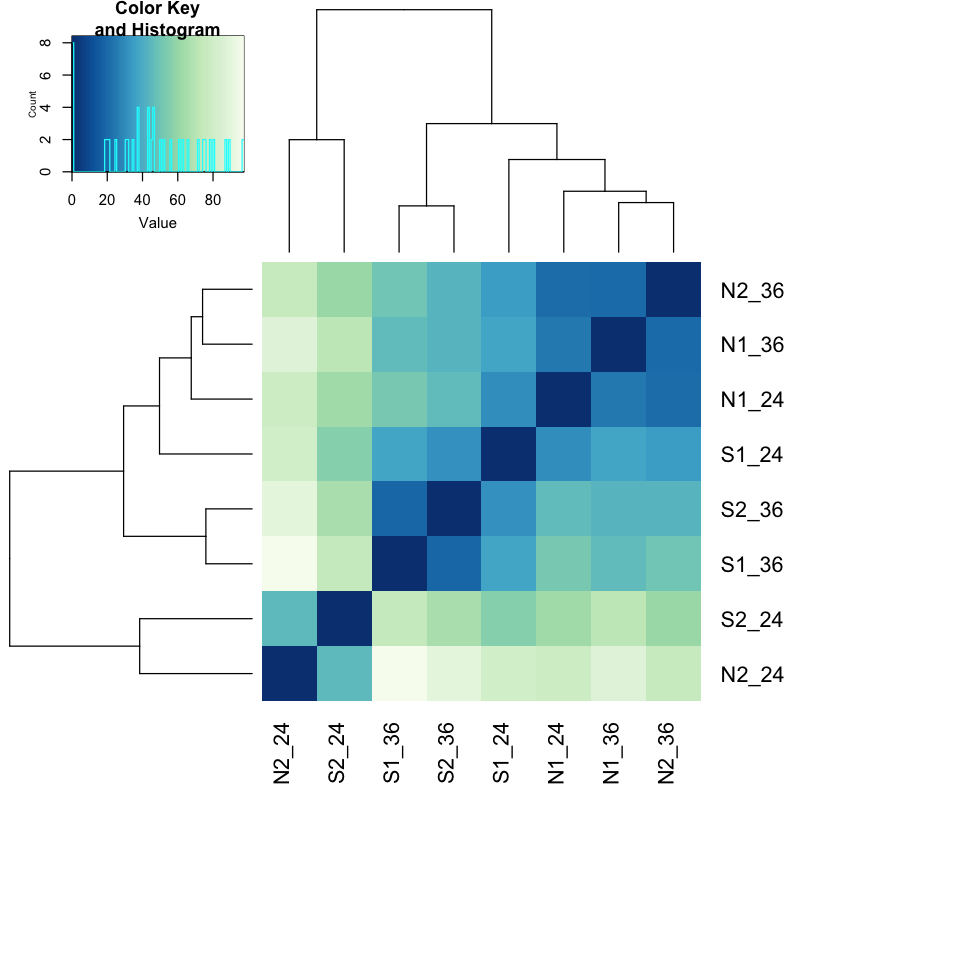

In [53]:
distsRL <- dist(t(assay(rld)))
mat <- as.matrix(distsRL)
rownames(mat) <- colnames(mat) <- with(colData(dds), paste(rownames(colData(dds))))
hc <- hclust(distsRL)

options(repr.plot.width=8, repr.plot.height=8)
heatmap.2(mat, Rowv=as.dendrogram(hc), symm=TRUE, trace="none", col = rev(hmcol), margin=c(13, 13))

In [54]:
pdf("Sample_correlation.pdf",width = 5,height = 5)
heatmap.2(mat, Rowv=as.dendrogram(hc), symm=TRUE, trace="none", col = rev(hmcol), margin=c(13, 13))
dev.off()

pdf 
  2

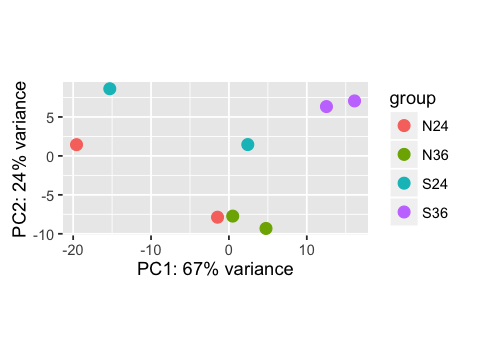

In [24]:
options(repr.plot.width=4, repr.plot.height=3)
plotPCA(rld, intgroup="condition")

In [25]:
library(ggplot2)


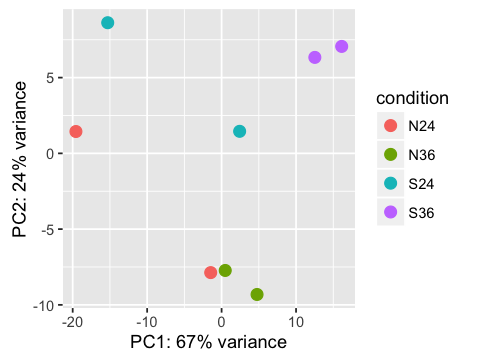

In [26]:
data <- plotPCA(rld, intgroup="condition", returnData=TRUE)
percentVar <- round(100 * attr(data, "percentVar"))
ggplot(data, aes(PC1, PC2, color=condition)) + geom_point(size=3) + xlab(paste0("PC1: ",percentVar[1],"% variance")) + ylab(paste0("PC2: ",percentVar[2],"% variance"))

In [27]:
pdf("PCA.results.pdf",width = 4,height = 3)
ggplot(data, aes(PC1, PC2, color=condition)) + geom_point(size=3) + xlab(paste0("PC1: ",percentVar[1],"% variance")) + ylab(paste0("PC2: ",percentVar[2],"% variance"))
dev.off()

pdf 
  2

In [61]:
betas <- coef(dds)
colnames(betas)

[1] "Intercept"    "conditionN24" "conditionN36" "conditionS24" "conditionS36"

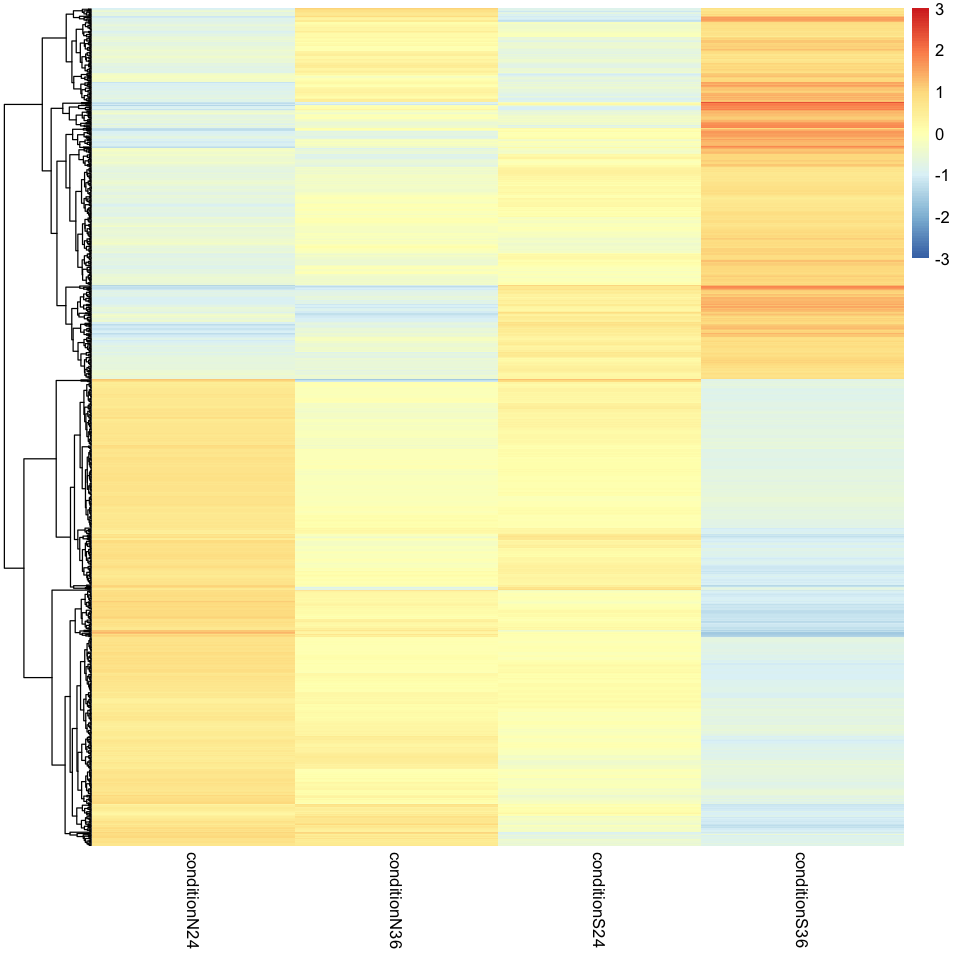

In [73]:
res = results(dds)
res$symbol <- mcols(dds)$symbol

library("pheatmap")
topGenes <- head(order(res$padj),1000)
mat <- betas[topGenes,-1]
thr <- 3 
mat[mat < -thr] <- -thr
mat[mat > thr] <- thr
pheatmap(mat, breaks=seq(from=-thr, to=thr, length=101), cluster_col=FALSE,show_rownames=F)

In [72]:
head(res)

log2 fold change (MAP): condition S36 vs N24 
Wald test p-value: condition S36 vs N24 
DataFrame with 6 rows and 6 columns
                 baseMean log2FoldChange     lfcSE      stat       pvalue
                <numeric>      <numeric> <numeric> <numeric>    <numeric>
ENSG00000000003 1087.4744      0.3818250 0.4292182 0.8895824 3.736902e-01
ENSG00000000419  577.4664      0.6143804 0.4127490 1.4885083 1.366169e-01
ENSG00000000457  118.5579      1.6208719 0.3738738 4.3353450 1.455317e-05
ENSG00000000460  263.3682      0.3507786 0.4366003 0.8034318 4.217252e-01
ENSG00000001036  436.0764      0.1078691 0.3461268 0.3116463 7.553093e-01
ENSG00000001084  426.1927      0.3520317 0.4083382 0.8621080 3.886281e-01
                        padj
                   <numeric>
ENSG00000000003 0.5924213860
ENSG00000000419 0.3369313188
ENSG00000000457 0.0009008984
ENSG00000000460 0.6338013071
ENSG00000001036 0.8679439528
ENSG00000001084 0.6056719072

In [ ]:
topGenes <- head(order(res$padj),1000)
mat <- betas[topGenes,-1]
thr <- 3 
mat[mat < -thr] <- -thr
mat[mat > thr] <- thr
pheatmap(mat, breaks=seq(from=-thr, to=thr, length=101), cluster_col=FALSE,show_rownames=F)

In [74]:
head(topGenes)

[1]  3177 13468  6665  3112 13135  6950

In [75]:
head(betas)

,Intercept,conditionN24,conditionN36,conditionS24,conditionS36
ENSG00000000003,10.0592032942004,-0.215647861485831,0.269123525263277,-0.219647751148996,0.166177109560243
ENSG00000000419,9.14803818812778,-0.359375671919994,0.0312404722001087,0.0731350752141237,0.255004691783372
ENSG00000000457,6.73191373482896,-0.776217970437565,-0.139693813681817,0.071261190894267,0.844653954221014
ENSG00000000460,8.02131410147005,-0.223689497333275,0.232100008092739,-0.135495573432221,0.127089067418637
ENSG00000001036,8.76329890102917,-0.0853432521161439,0.161181534827662,-0.0983598016122686,0.0225258940922361
ENSG00000001084,8.72538003723621,-0.189785942840828,0.10160724375371,-0.0740626686446079,0.162245723991728


In [84]:
na = rownames(subset(res_36,padj<0.1))

In [85]:
length(na)

[1] 514

In [86]:
diff = betas[na,]

In [87]:
head(diff)

,Intercept,conditionN24,conditionN36,conditionS24,conditionS36
ENSG00000003402,7.62926549619464,-0.553970855484992,-0.215659062104297,-0.206596181211509,0.976229907811282
ENSG00000004660,6.69965542324292,0.739065294528555,0.274996103737721,0.0902625027028883,-1.10432055607865
ENSG00000004777,7.76987219887765,0.87447011254134,0.209865879411617,-0.00318811959113897,-1.08114399315159
ENSG00000006756,6.84547727829654,-0.257908762829273,-0.766382823826103,0.35002357982319,0.67427142452617
ENSG00000007237,7.23037751355977,0.345778907885387,0.643604695475301,-0.298031354477542,-0.691348639022692
ENSG00000010278,9.9566023277698,0.396380086629884,0.350735552478381,0.0666567880436001,-0.813767456188045


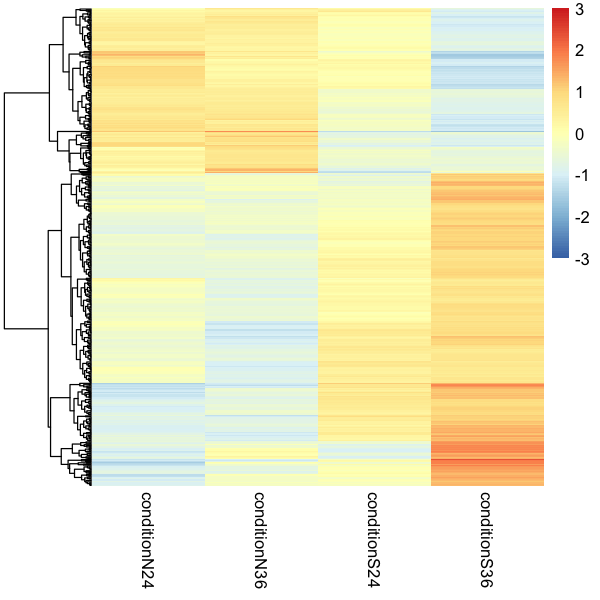

In [89]:
options(repr.plot.width=5, repr.plot.height=5)
mat <- betas[na,-1]
thr <- 3 
mat[mat < -thr] <- -thr
mat[mat > thr] <- thr
pheatmap(mat, breaks=seq(from=-thr, to=thr, length=101), cluster_col=FALSE,show_rownames=F)

In [90]:
pdf("Diff_gene_heatmap.pdf",width = 5,height = 5)
mat <- betas[na,-1]
thr <- 3 
mat[mat < -thr] <- -thr
mat[mat > thr] <- thr
pheatmap(mat, breaks=seq(from=-thr, to=thr, length=101), cluster_col=FALSE,show_rownames=F)
dev.off()

pdf 
  2